In [1]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import pandas as pd
import numpy as np

# Load dataset
data = pd.read_csv("/Users/konstantinosdalampekis/VS_code/Quantum_Challenge/Quantum-Fraud-Detection-/Datasets/PS_20174392719_1491204439457_log.csv")

# Encode the 'type' column
encoder = OneHotEncoder(sparse_output=False)
type_encoded = encoder.fit_transform(data[['type']])
type_encoded_columns = [f"type_{cat}" for cat in encoder.categories_[0]]

# Add one-hot encoded columns to the dataset and drop the original 'type' column
type_encoded_df = pd.DataFrame(type_encoded, columns=type_encoded_columns, index=data.index)
data = pd.concat([data.drop(columns=['type']), type_encoded_df], axis=1)

# Create derived features
data['balance_diff_org'] = data['oldbalanceOrg'] - data['newbalanceOrig']
data['balance_diff_dest'] = data['oldbalanceDest'] - data['newbalanceDest']
data['amount_to_balance_ratio'] = data['amount'] / (data['oldbalanceOrg'] + 1e-5)

# Combine features into the final dataset
final_features = ['step', 'amount', 'oldbalanceOrg', 'newbalanceOrig', 
                  'oldbalanceDest', 'newbalanceDest', 'balance_diff_org', 
                  'balance_diff_dest', 'amount_to_balance_ratio'] + type_encoded_columns
data = data[final_features + ['isFraud']]  # Retain only the selected features and target column

# Scale the features (exclude 'isFraud')
scaler = StandardScaler()
data[final_features] = scaler.fit_transform(data[final_features])


In [2]:
print(data.columns)


Index(['step', 'amount', 'oldbalanceOrg', 'newbalanceOrig', 'oldbalanceDest',
       'newbalanceDest', 'balance_diff_org', 'balance_diff_dest',
       'amount_to_balance_ratio', 'type_CASH_IN', 'type_CASH_OUT',
       'type_DEBIT', 'type_PAYMENT', 'type_TRANSFER', 'isFraud'],
      dtype='object')


In [3]:
import numpy as np
from gym import Env
from gym.spaces import Discrete, Box

class FraudDetectionEnv(Env):
    def __init__(self, data, max_steps=100):
        """
        Initialize the Fraud Detection Environment.
        :param data: Preprocessed transaction dataset.
        :param max_steps: Number of steps in each episode.
        """
        self.data = data
        self.features = data.columns.drop(['isFraud'])  # All features except target

        # Action space: {0: non-fraud, 1: fraud}
        self.action_space = Discrete(2)
        
        # State space: Dynamic based on feature size
        self.observation_space = Box(
            low=-np.inf, high=np.inf, shape=(len(self.features),), dtype=np.float32
        )

        # Internal variables
        self.max_steps = max_steps
        self.current_step = 0
        self.episode_rewards = 0
        self.current_index = 0

    def reset(self):
        """
        Reset the environment to start a new episode.
        :return: Initial state.
        """
        self.current_step = 0
        self.episode_rewards = 0
        self.current_index = np.random.randint(0, len(self.data) - self.max_steps)
        return self.data[self.features].iloc[self.current_index].values

    def step(self, action):
        """
        Perform an action and advance to the next transaction.
        :param action: 0 (non-fraud) or 1 (fraud).
        :return: Tuple (next_state, reward, done, info).
        """
        row = self.data.iloc[self.current_index]
        is_fraud = row['isFraud']

        # Reward mechanism
        if action == 1 and is_fraud == 1:  # Correct fraud detection
            reward = 1.0
        elif action == 1 and is_fraud == 0:  # False positive
            reward = -0.3
        elif action == 0 and is_fraud == 1:  # False negative
            reward = -1.5
        else:  # Correct non-fraud detection
            reward = 0.5

        self.episode_rewards += reward

        # Move to the next transaction
        self.current_step += 1
        self.current_index += 1

        # Check if episode is done
        done = self.current_step >= self.max_steps or self.current_index >= len(self.data) - 1

        # Get the next state
        next_state = None if done else self.data[self.features].iloc[self.current_index].values

        return next_state, reward, done, {}

    def render(self):
        """
        Render the current episode summary.
        """
        print(f"Step: {self.current_step}, Total Rewards: {self.episode_rewards}")


In [4]:
import pennylane as qml
from pennylane import numpy as np

num_qubits = len(data.columns.drop(['isFraud']))  # Dynamically match feature count

# Create a quantum device
dev = qml.device("default.qubit", wires=num_qubits)

@qml.qnode(dev)
def variational_circuit(inputs, weights):
    # Encode input features as quantum states
    for i in range(num_qubits):
        qml.RY(inputs[i], wires=i)

    # Apply parameterized layers
    for i in range(len(weights)):
        for j in range(num_qubits):
            qml.RY(weights[i, j], wires=j)
            qml.RZ(weights[i, j], wires=j)
        for j in range(num_qubits - 1):
            qml.CNOT(wires=[j, j + 1])

    # Measure the expectation value for the Pauli-Z operator
    return [qml.expval(qml.PauliZ(i)) for i in range(num_qubits)]


/Users/konstantinosdalampekis/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [5]:
import torch
import torch.nn as nn
import torch.optim as optim

class HybridQNN(nn.Module):
    def __init__(self, num_qubits, num_layers, num_actions):
        super(HybridQNN, self).__init__()
        # Quantum layer weights
        self.q_weights = nn.Parameter(torch.randn(num_layers, num_qubits))

        # Fully connected layer for classical post-processing
        self.fc = nn.Linear(num_qubits, num_actions)

    def forward(self, x):
        # Convert classical input to quantum-compatible input
        x = torch.tensor(x, dtype=torch.float32)

        # Pass input through quantum circuit
        q_out = variational_circuit(x, self.q_weights.detach().numpy())

        # Classical post-processing
        q_out = torch.tensor(q_out, dtype=torch.float32)
        return self.fc(q_out)


In [6]:
# Define hyperparameters
num_episodes = 500
learning_rate = 0.01
gamma = 0.99  # Discount factor

# Initialize the environment and QRL agent
env = FraudDetectionEnv(data, max_steps=100)
agent = HybridQNN(num_qubits=num_qubits, num_layers=3, num_actions=2)
optimizer = optim.Adam(agent.parameters(), lr=learning_rate)

# Retrain the agent
reward_history = []
for episode in range(num_episodes):
    state = env.reset()
    done = False
    rewards = []
    log_probs = []

    while not done:
        state_tensor = torch.tensor(state, dtype=torch.float32)
        action_probs = torch.softmax(agent(state_tensor), dim=-1)
        action_dist = torch.distributions.Categorical(action_probs)
        action = action_dist.sample()

        log_prob = action_dist.log_prob(action)
        log_probs.append(log_prob)

        next_state, reward, done, _ = env.step(action.item())
        rewards.append(reward)
        state = next_state if not done else None

    # Compute discounted rewards and policy update
    discounted_rewards = []
    cumulative_reward = 0
    for r in reversed(rewards):
        cumulative_reward = r + gamma * cumulative_reward
        discounted_rewards.insert(0, cumulative_reward)
    discounted_rewards = torch.tensor(discounted_rewards, dtype=torch.float32)
    discounted_rewards = (discounted_rewards - discounted_rewards.mean()) / (discounted_rewards.std() + 1e-5)

    loss = 0
    for log_prob, reward in zip(log_probs, discounted_rewards):
        loss -= log_prob * reward

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    total_reward = sum(rewards)
    reward_history.append(total_reward)

    if episode % 10 == 0:
        print(f"Episode {episode}: Total Reward = {total_reward}")



/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 0: Total Reward = 13.999999999999986


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 10: Total Reward = 19.599999999999987


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 20: Total Reward = 25.999999999999986


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 30: Total Reward = 30.79999999999999


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 40: Total Reward = 35.60000000000001


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 50: Total Reward = 36.39999999999999


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 60: Total Reward = 12.399999999999984


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 70: Total Reward = 34.79999999999999


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 80: Total Reward = 44.400000000000006


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 90: Total Reward = 44.40000000000001


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 100: Total Reward = 46.8


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 110: Total Reward = 38.0


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 120: Total Reward = 28.399999999999988


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 130: Total Reward = 46.8


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 140: Total Reward = 43.599999999999994


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 150: Total Reward = 43.599999999999994


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 160: Total Reward = 38.00000000000001


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 170: Total Reward = 37.99999999999999


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 180: Total Reward = 41.2


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 190: Total Reward = 47.60000000000001


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 200: Total Reward = 46.00000000000001


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 210: Total Reward = 45.2


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 220: Total Reward = 47.6


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 230: Total Reward = 47.599999999999994


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 240: Total Reward = 45.2


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 250: Total Reward = 33.19999999999999


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 260: Total Reward = 46.0


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 270: Total Reward = 47.6


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 280: Total Reward = 49.2


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 290: Total Reward = 49.2


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 300: Total Reward = 46.00000000000001


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 310: Total Reward = 49.2


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 320: Total Reward = 48.4


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 330: Total Reward = 46.0


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 340: Total Reward = 48.4


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 350: Total Reward = 48.400000000000006


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 360: Total Reward = 50.0


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 370: Total Reward = 50.0


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 380: Total Reward = 48.400000000000006


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 390: Total Reward = 49.2


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 400: Total Reward = 48.400000000000006


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 410: Total Reward = 46.0


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 420: Total Reward = 50.0


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 430: Total Reward = 48.400000000000006


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 440: Total Reward = 48.4


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 450: Total Reward = 44.400000000000006


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 460: Total Reward = 48.4


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 470: Total Reward = 46.0


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 480: Total Reward = 42.0


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Episode 490: Total Reward = 49.2


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

In [7]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import matplotlib.pyplot as plt

def evaluate_agent(agent, env, num_episodes=100):
    """
    Evaluate the QRL agent on the environment.
    :param agent: Trained QRL agent.
    :param env: FraudDetectionEnv environment.
    :param num_episodes: Number of episodes for evaluation.
    :return: Metrics and performance data.
    """
    y_true = []
    y_pred = []

    for episode in range(num_episodes):
        state = env.reset()
        done = False

        while not done:
            # Get action probabilities from the agent
            state_tensor = torch.tensor(state, dtype=torch.float32)
            action_probs = torch.softmax(agent(state_tensor), dim=-1)
            action = torch.argmax(action_probs).item()  # Take the most likely action

            # Store true label and prediction
            y_true.append(env.data.iloc[env.current_index]['isFraud'])
            y_pred.append(action)

            # Step the environment
            state, _, done, _ = env.step(action)

    # Compute metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    auc_roc = roc_auc_score(y_true, y_pred)

    metrics = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1,
        'AUC-ROC': auc_roc
    }

    return metrics, y_true, y_pred


In [8]:
def evaluate_agent(agent, env, num_episodes=100):
    """
    Evaluate the QRL agent on the environment.
    :param agent: Trained QRL agent.
    :param env: FraudDetectionEnv environment.
    :param num_episodes: Number of episodes for evaluation.
    :return: Metrics and performance data.
    """
    y_true = []
    y_pred = []

    for episode in range(num_episodes):
        state = env.reset()
        done = False

        while not done:
            # Get action probabilities from the agent
            state_tensor = torch.tensor(state, dtype=torch.float32)
            action_probs = torch.softmax(agent(state_tensor), dim=-1)
            action = torch.argmax(action_probs).item()  # Take the most likely action

            # Store true label and prediction
            y_true.append(env.data.iloc[env.current_index]['isFraud'])
            y_pred.append(action_probs[1].item())  # Probability of 'Fraud' (action 1)

            # Step the environment
            state, _, done, _ = env.step(action)

    # Convert predicted probabilities to binary predictions
    y_pred_binary = [1 if p >= 0.5 else 0 for p in y_pred]

    # Compute metrics
    accuracy = accuracy_score(y_true, y_pred_binary)
    precision = precision_score(y_true, y_pred_binary)
    recall = recall_score(y_true, y_pred_binary)
    f1 = f1_score(y_true, y_pred_binary)
    auc_roc = roc_auc_score(y_true, y_pred)

    metrics = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1,
        'AUC-ROC': auc_roc
    }

    return metrics, y_true, y_pred_binary


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r

Evaluation Metrics:
Accuracy: 0.9986
Precision: 0.0000
Recall: 0.0000
F1-Score: 0.0000
AUC-ROC: 0.8212


/var/folders/qx/19w6xs4j0fxc12b99xqr7x6r0000gn/T/ipykernel_7151/210665918.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float32)
/Users/konstantinosdalampekis/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


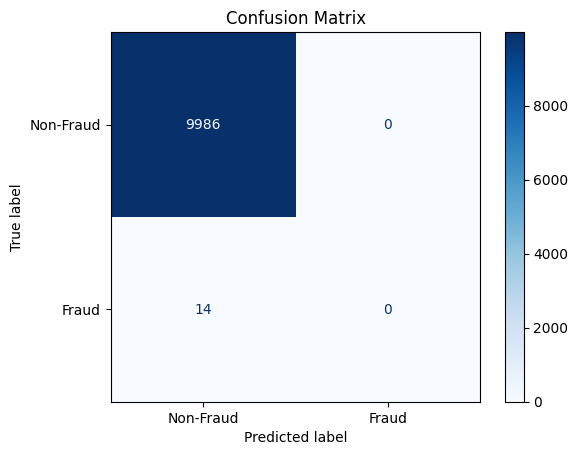

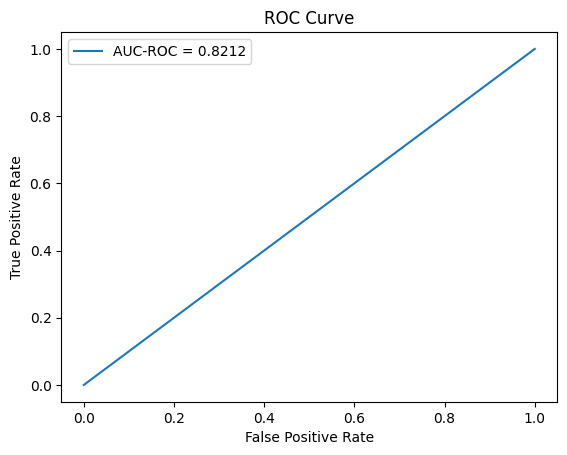

In [9]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_curve

def plot_results(metrics, y_true, y_pred):
    """
    Visualize the evaluation results.
    :param metrics: Dictionary of evaluation metrics.
    :param y_true: True labels.
    :param y_pred: Predicted labels.
    """
    print("Evaluation Metrics:")
    for metric, value in metrics.items():
        print(f"{metric}: {value:.4f}")

    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Non-Fraud', 'Fraud'])
    disp.plot(cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.show()

    # ROC Curve
    fpr, tpr, thresholds = roc_curve(y_true, y_pred)
    plt.plot(fpr, tpr, label=f"AUC-ROC = {metrics['AUC-ROC']:.4f}")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve")
    plt.legend(loc="best")
    plt.show()

# Run evaluation and visualization
metrics, y_true, y_pred_binary = evaluate_agent(agent, env)
plot_results(metrics, y_true, y_pred_binary )


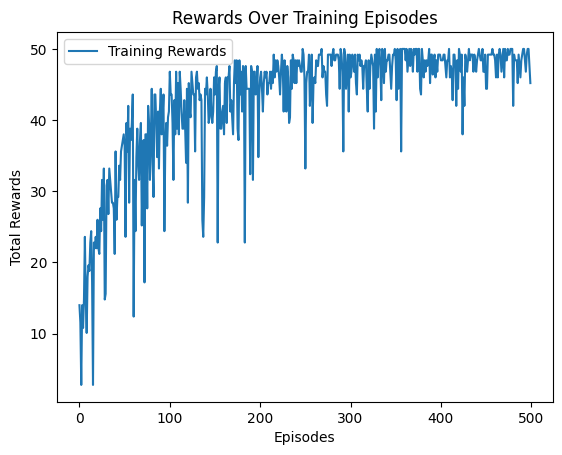

In [10]:
def plot_training_rewards(reward_history):
    """
    Plot the total rewards earned during training.
    :param reward_history: List of rewards per episode.
    """
    plt.plot(range(len(reward_history)), reward_history, label="Training Rewards")
    plt.xlabel("Episodes")
    plt.ylabel("Total Rewards")
    plt.title("Rewards Over Training Episodes")
    plt.legend()
    plt.show()

# Assuming `reward_history` contains the total rewards from training
plot_training_rewards(reward_history)
